In [1]:
%matplotlib inline
import os, sys
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import cv2
import re
import util
from model import AffineNet
import train

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [2]:
path = "DATA_FINAL/"

# load the dataset
dataset = np.load(path+'dataset.npz')

imgs_rgb = dataset['rgb']
imgs_ir = dataset['ir']
imgs_mask_rgb = dataset['mask_rgb']
imgs_mask_ir = dataset['mask_ir']

print(imgs_rgb.shape, imgs_ir.shape, imgs_mask_rgb.shape, imgs_mask_ir.shape)

(10431, 240, 320, 3) (10431, 240, 320, 3) (10431, 240, 320) (10431, 240, 320)


In [3]:
# split the dataset in train and test set
imgs_rgb_train, imgs_ir_train, imgs_rgb_test, imgs_ir_test, imgs_mask_rgb_train, imgs_mask_ir_train, imgs_mask_rgb_test, imgs_mask_ir_test = util.splitDataset(imgs_rgb, imgs_ir, imgs_mask_rgb, imgs_mask_ir, 8000, True)

imgs_mask_rgb_train.shape, imgs_mask_rgb_test.shape, imgs_rgb_train.shape, imgs_rgb_test.shape

((8000, 240, 320), (2431, 240, 320), (8000, 240, 320, 3), (2431, 240, 320, 3))

In [4]:
# split the test set in validation and test set
imgs_rgb_val = imgs_rgb_test[0:1000]
imgs_ir_val = imgs_ir_test[0:1000]
imgs_mask_rgb_val = imgs_mask_rgb_test[0:1000]
imgs_mask_ir_val = imgs_mask_ir_test[0:1000]

In [5]:
model = AffineNet().to(device)

In [6]:
beg = 0
end = 8000

# prepare training frames to be used in the affine network
imRGB = util.parseImages(imgs_mask_rgb_train, end)
imRGB = imRGB[beg:end, ...]

imIR = util.parseImages(imgs_mask_ir_train, end)
imIR = imIR[beg:end, ...]

imIR.shape

torch.Size([8000, 1, 240, 320])

In [7]:
beg = 0
end = 1000

# prepare validation frames to be used in the affine network
imRGB_test = util.parseImages(imgs_mask_rgb_val, end)
imRGB_test = imRGB_test[beg:end, ...]

imIR_test = util.parseImages(imgs_mask_ir_val, end)
imIR_test = imIR_test[beg:end, ...]

imIR_test.shape

torch.Size([1000, 1, 240, 320])

In [8]:
mini_batch_size = 20
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

In [9]:
model = model.to(device)

# train the model and comupute the validation error
res = train.trainAndVal(model, imRGB, imIR, 100, mini_batch_size, criterion, optimizer, imRGB_test, imIR_test)

C:\Users\lucaw\Anaconda3\lib\site-packages\torch\nn\functional.py:2764: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "
C:\Users\lucaw\Anaconda3\lib\site-packages\torch\nn\functional.py:2705: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


epoch 1: loss = 56.77086563408375
epoch 2: loss = 56.38680209964514
epoch 3: loss = 56.79515480436385
epoch 4: loss = 55.67246510833502
epoch 5: loss = 55.72407818958163
epoch 6: loss = 54.42149642854929
epoch 7: loss = 54.52952382713556
epoch 8: loss = 55.58952418901026
epoch 9: loss = 56.047945622354746
epoch 10: loss = 56.83782521635294
epoch 11: loss = 54.989615043625236
epoch 12: loss = 54.73628162033856
epoch 13: loss = 53.825659381225705
epoch 14: loss = 53.725538801401854
epoch 15: loss = 55.126860996708274
epoch 16: loss = 52.81436747312546
epoch 17: loss = 53.93482104688883
epoch 18: loss = 55.23854533396661
epoch 19: loss = 54.841014076024294
epoch 20: loss = 52.63188732787967
epoch 21: loss = 54.45869109965861
epoch 22: loss = 54.441009260714054
epoch 23: loss = 54.487587524577975
epoch 24: loss = 56.090537790209055
epoch 25: loss = 54.57453040033579
epoch 26: loss = 54.05505500175059
epoch 27: loss = 55.36468631029129
epoch 28: loss = 56.10947402380407
epoch 29: loss = 55.

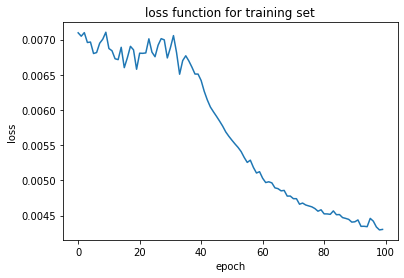

In [10]:
# print the training error
util.printGraphLoss(res[0], "loss function for training set")

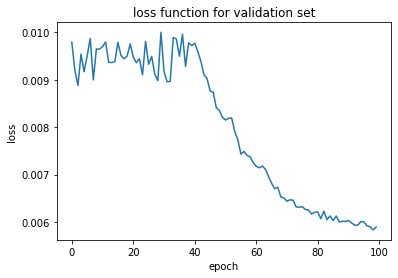

In [11]:
# print the validation error
util.printGraphLoss(res[1], "loss function for validation set")

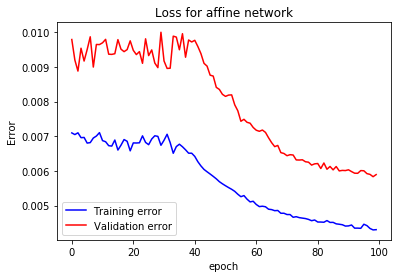

In [12]:
# print the training and validation errors
x = list(range(0, 100))
fig = plt.figure()
ax = plt.axes()
plt.plot(x, res[0], color='blue', linestyle='solid', label='Training error')
plt.plot(x, res[1], color='red', linestyle='solid', label='Validation error')
plt.title("Loss for affine network")
plt.legend(loc='lower left')
ax = ax.set(xlabel='epoch', ylabel='Error')

C:\Users\lucaw\Documents\EPFL\BachelorProjectFinal\util.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 15))


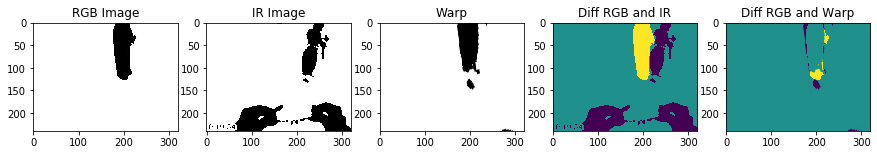

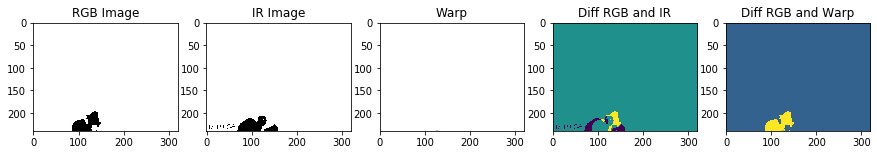

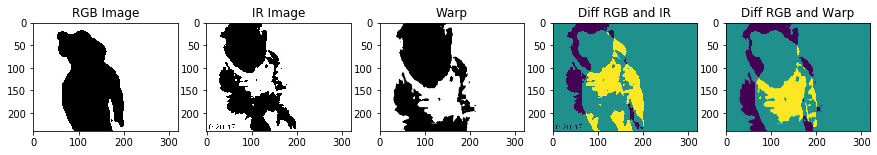

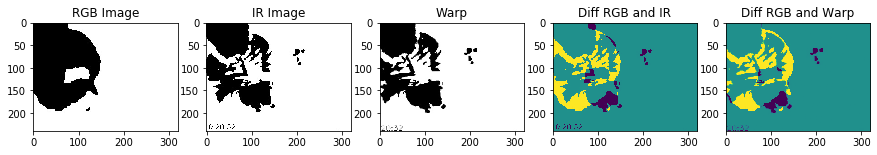

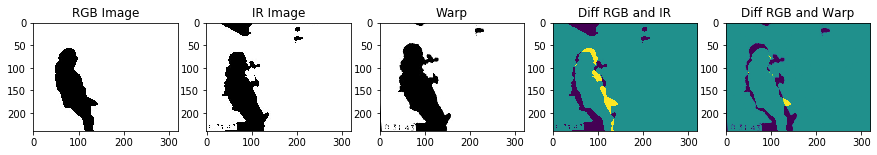

...

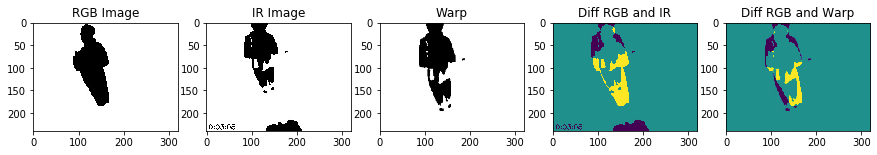

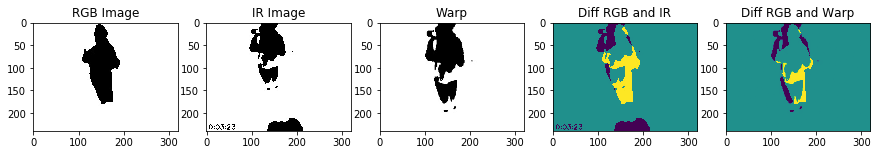

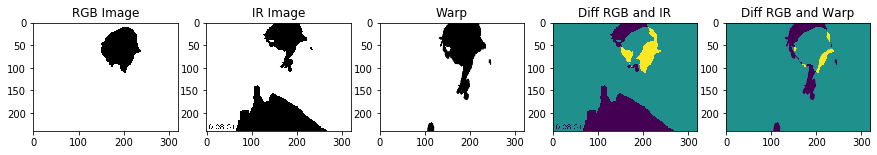

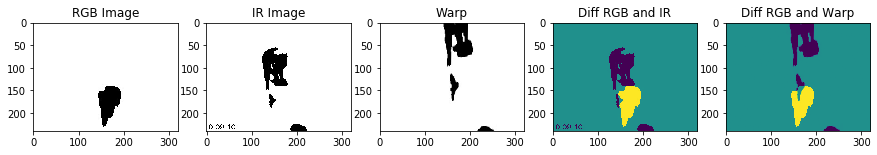

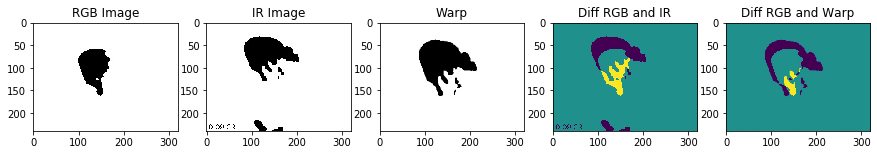

In [13]:
# print the results with the masks
for i in range(0, 8000, 100):
    util.printResult(*util.getImagesById(imRGB.cpu(), imIR.cpu(), i, model.cpu()), cmap='viridis')

In [14]:
beg = 1000
end = 2400

# prepare the test set to be used in the network
imRGB_test2 = util.parseImages(imgs_mask_rgb_test, end)
imRGB_test2 = imRGB_test2[beg:end, ...]

imIR_test2 = util.parseImages(imgs_mask_ir_test, end)
imIR_test2 = imIR_test2[beg:end, ...]

imIR_test2.shape

torch.Size([1400, 1, 240, 320])

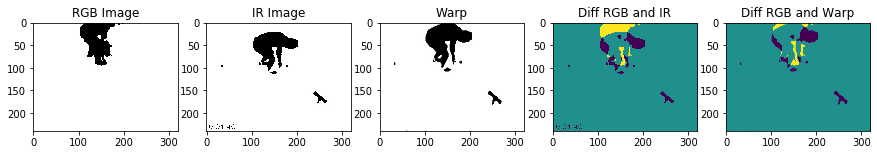

In [21]:
# example with the test set
with torch.no_grad():
    util.printResult(*util.getImagesById(imRGB_test2.cpu(), imIR_test2.cpu(), 390, model.cpu()), cmap='viridis')

In [22]:
# load all the flow field (to be used on the original frames)
flows = util.getAllFlows(imIR, imRGB, model)

flows.shape

torch.Size([8000, 240, 320, 2])

In [23]:
# apply flow on the original frames
x = util.applyFlowToColoredImages(imgs_ir_train, flows[1000:2000], 1000, 2000)
x.shape

(1000, 240, 320, 3)

In [24]:
# superpose the rgb and ir frames (before registration and after registration)
superposedImages = util.superposeTwoImages(imgs_rgb_train[1000:2000], (x*255).astype('uint8'))
superposedImages2 = util.superposeTwoImages(imgs_rgb_train[1000:2000], imgs_ir_train[1000:2000])
print(superposedImages.shape, superposedImages2.shape)

(1000, 240, 320, 3) (1000, 240, 320, 3)


C:\Users\lucaw\Documents\EPFL\BachelorProjectFinal\util.py:380: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 15))


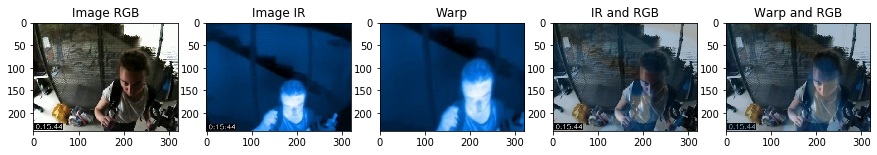

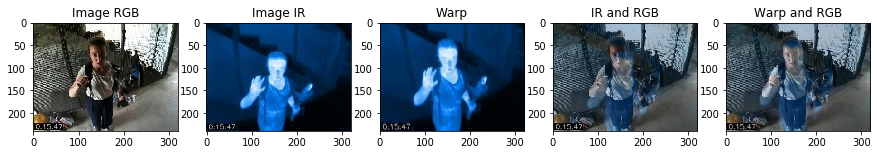

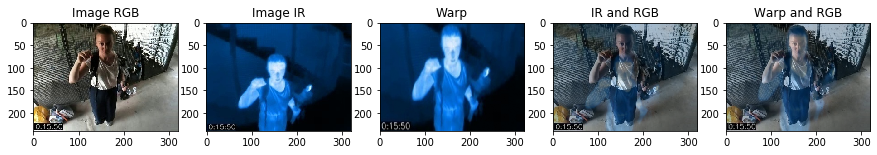

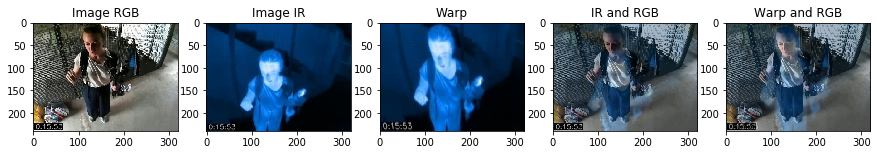

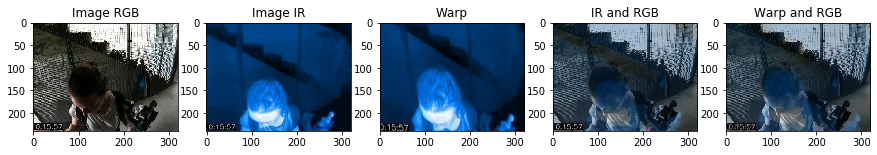

...

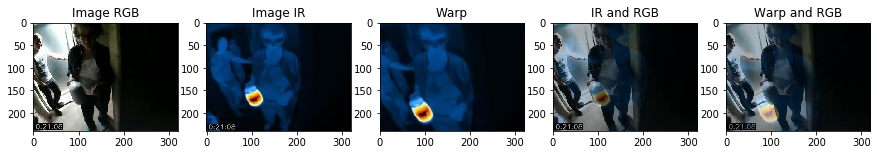

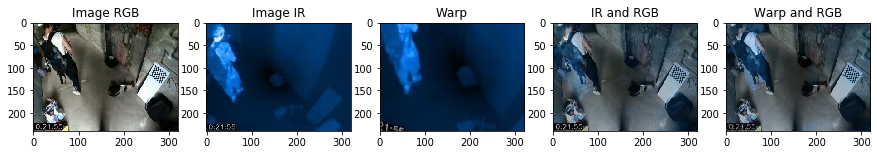

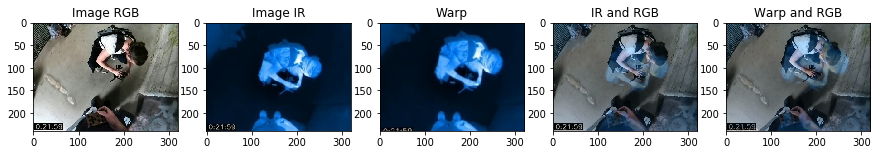

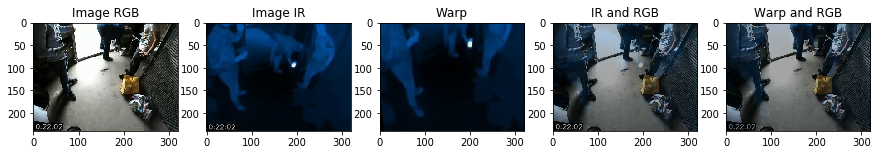

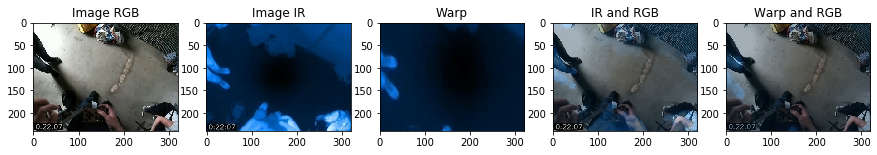

In [25]:
# print results on the original frames
for i in range(0, 1000, 20):
    util.printFinal(x[i], imgs_rgb_train[i+1000], imgs_ir_train[i+1000], superposedImages[i], superposedImages2[i])

In [26]:
# save the data in different folder (train, validation, test)
util.saveImages(imgs_mask_rgb_train, "DATA2/Results/AffineNetwork/train/mask_rgb")

util.saveImages(imgs_mask_ir_train, "DATA2/Results/AffineNetwork/train/mask_ir")

util.saveImages(imgs_rgb_train, "DATA2/Results/AffineNetwork/train/rgb")

util.saveImages(imgs_ir_train, "DATA2/Results/AffineNetwork/train/ir")

In [27]:
torch.save(model.state_dict(), "Model/model_affine_segmentation_e100.pt")

In [29]:
util.saveImages(imgs_mask_rgb_test[0:1000], "DATA2/Results/AffineNetwork/validation/mask_rgb")

util.saveImages(imgs_mask_ir_test[0:1000], "DATA2/Results/AffineNetwork/validation/mask_ir")

util.saveImages(imgs_rgb_test[0:1000], "DATA2/Results/AffineNetwork/validation/rgb")

util.saveImages(imgs_ir_test[0:1000], "DATA2/Results/AffineNetwork/validation/ir")

In [30]:
util.saveImages(imgs_mask_rgb_test[1000:2400], "DATA2/Results/AffineNetwork/test/mask_rgb")

util.saveImages(imgs_mask_ir_test[1000:2400], "DATA2/Results/AffineNetwork/test/mask_ir")

util.saveImages(imgs_rgb_test[1000:2400], "DATA2/Results/AffineNetwork/test/rgb")

util.saveImages(imgs_ir_test[1000:2400], "DATA2/Results/AffineNetwork/test/ir")

In [31]:
util.saveVideo(superposedImages, 13.0, 320, 240, 'DATA2/Results/AffineNetwork/train/warp_rgb.avi')

In [32]:
util.saveVideo(superposedImages2, 13.0, 320, 240, 'DATA2/Results/AffineNetwork/train/ir_rgb.avi')